In [ ]:
import cv2
from google.colab import drive
import matplotlib.pyplot as plt

In [ ]:
drive.mount("/content/drive/")

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


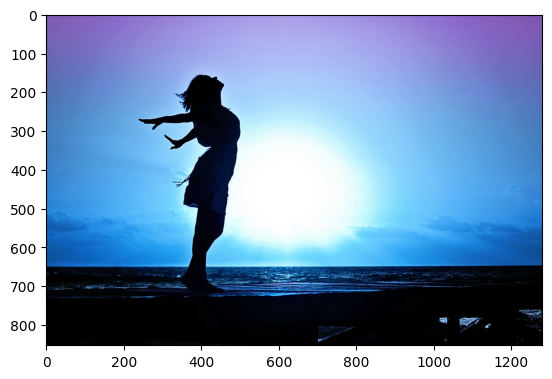

In [ ]:
imagen = cv2.imread("/content/drive/MyDrive/Analisis y clasificacion de rostros/Imagenes/px-girl.jpg")
plt.imshow(imagen)

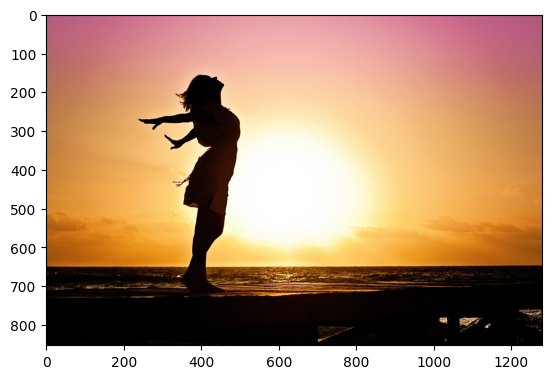

In [ ]:
imagen_rgb = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
plt.imshow(imagen_rgb)

In [ ]:
imagen_rgb.shape

(853, 1280, 3)

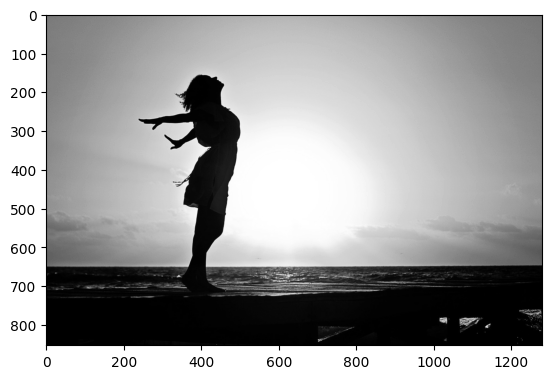

In [ ]:
imagen_gris = cv2.cvtColor(imagen_rgb, cv2.COLOR_RGB2GRAY)
plt.imshow(imagen_gris, cmap = 'gray')

In [ ]:
#visualizacion de la cantidad de capas de la imagen en blanco y negro
imagen_gris.shape

(853, 1280)

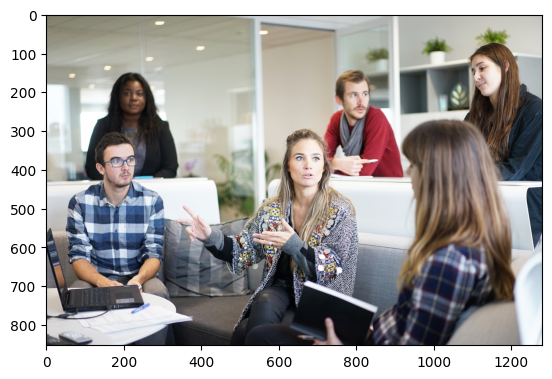

In [ ]:
imagen = cv2.imread("/content/drive/MyDrive/Analisis y clasificacion de rostros/Imagenes/px-people.jpg")
imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
plt.imshow(imagen)

In [ ]:
imagen.shape

(853, 1280, 3)

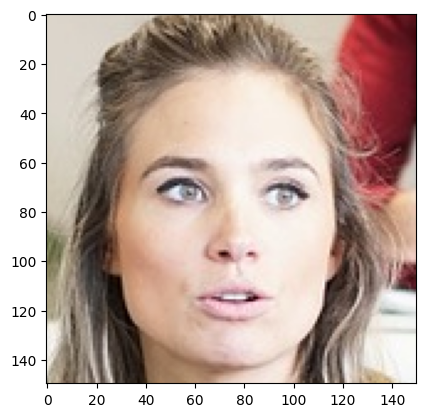

In [ ]:
#recortando imagen
imagen_roi = imagen[300:450, 600:750]
plt.imshow(imagen_roi)

In [ ]:
cv2.imwrite("/content/drive/MyDrive/Analisis y clasificacion de rostros/Imagenes/imagen_roi.png", imagen_roi)

True

In [ ]:
#cambio de bgr2rgb y guardado en drive
imagen_roi = cv2.cvtColor(imagen_roi, cv2.COLOR_RGB2BGR)
cv2.imwrite("/content/drive/MyDrive/Analisis y clasificacion de rostros/Imagenes/imagen_roi.png", imagen_roi)

True

### **Segmentacion de rostros**

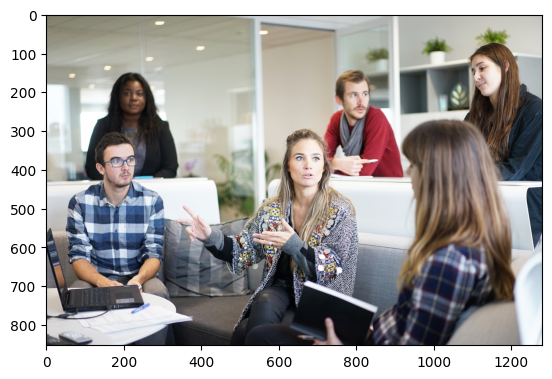

In [ ]:
imagen = cv2.imread("/content/drive/MyDrive/Analisis y clasificacion de rostros/Imagenes/px-people.jpg")
imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
plt.imshow(imagen)

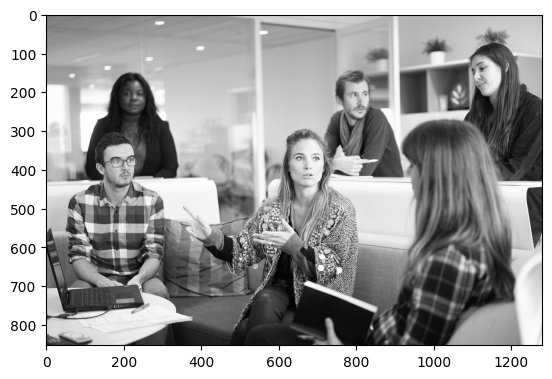

In [ ]:
imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_RGB2GRAY)
plt.imshow(imagen_gris, cmap = 'gray')

In [ ]:
#importando el clasificador de cascada
clasificador = cv2.CascadeClassifier("/content/drive/MyDrive/Analisis y clasificacion de rostros/Clasificadores/haarcascade_frontalface_default.xml")

In [ ]:
#deteccion de rostro - Clasificadores en cascada de Haar
rostros = clasificador.detectMultiScale(imagen_gris, 1.3, 5)

In [ ]:
len(rostros)

5

In [ ]:
#coordenadas de los rostros detectados
rostros

array([[ 189,  176,   75,   75],
       [ 767,  176,   84,   84],
       [1088,  102,  101,  101],
       [ 619,  327,  114,  114],
       [ 150,  337,  102,  102]], dtype=int32)

In [ ]:
#guardando rostros encontrados
rostro_imagen = 0
for (x, y, w, h) in rostros:
  rostro_imagen += 1
  imagen_roi = imagen[y:y+h, x:x+w]
  imagen_roi = cv2.cvtColor(imagen_roi, cv2.COLOR_RGB2BGR)
  cv2.imwrite("/content/drive/MyDrive/Analisis y clasificacion de rostros/Imagenes/rostro_" + str(rostro_imagen) + ".png", imagen_roi)

## **Clasificacion de rostros**

In [ ]:
from os import listdir, path, makedirs
from os.path import isfile, join
import shutil

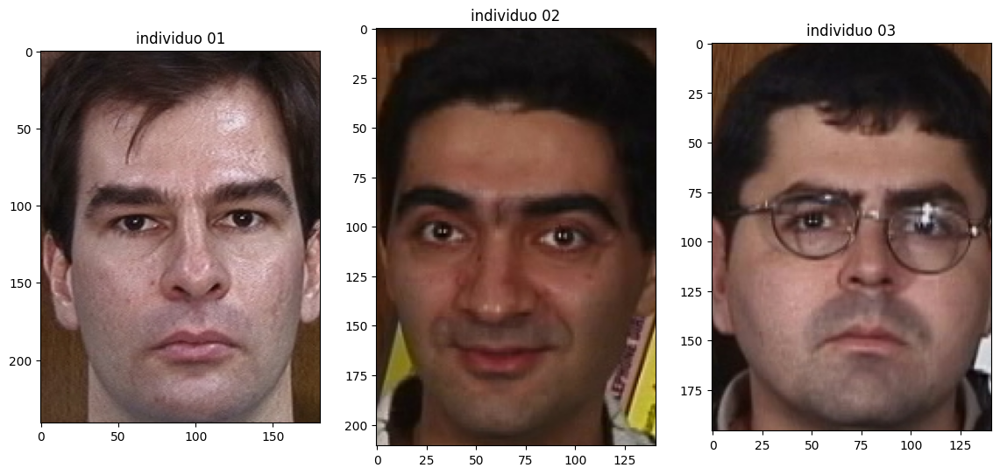

In [ ]:
rostros = []
plt.figure(figsize=(14,7))

for i in range(1,4):
  rostro = cv2.imread(f"/content/drive/MyDrive/Analisis y clasificacion de rostros/Imagenes/cropped_faces/s0{i}_01.jpg")
  rostro = cv2.cvtColor(rostro, cv2.COLOR_BGR2RGB)
  rostros.append(rostro)
  plt.subplot(130+i)
  plt.title(f"individuo 0{i}")
  plt.imshow(rostro)
plt.show()

In [ ]:
print(rostros[0].shape, rostros[1].shape, rostros[2].shape)

(241, 181, 3) (211, 141, 3) (196, 141, 3)


In [ ]:
rostros_path = "/content/drive/MyDrive/Analisis y clasificacion de rostros/Imagenes/cropped_faces/"
lista_archivo_rostros = [f for f in listdir(rostros_path) if isfile(join(rostros_path, f))]

In [ ]:
lista_archivo_rostros[0]

's10_13.jpg'

In [ ]:
len(lista_archivo_rostros)

750

In [ ]:
rostros_path_train = "/content/drive/MyDrive/Analisis y clasificacion de rostros/Imagenes/train/"
rostros_path_test = "/content/drive/MyDrive/Analisis y clasificacion de rostros/Imagenes/test/"


In [ ]:
if not path.exists(rostros_path_train):
  makedirs(rostros_path_train)
if not path.exists(rostros_path_test):
  makedirs(rostros_path_test)

In [ ]:
for archivo in lista_archivo_rostros:
  individuo = archivo[1:3]
  numero = archivo[4:6]
  if int(numero)<=10:
    shutil.copyfile(rostros_path + archivo, rostros_path_train + archivo)
  else:
    shutil.copyfile(rostros_path + archivo, rostros_path_test + archivo)

In [ ]:
def estandarizar_imagen(imagen_path):
  imagen = cv2.imread(imagen_path, cv2.IMREAD_GRAYSCALE)
  imagen = cv2.resize(imagen, (200,200), interpolation = cv2.INTER_LANCZOS4)
  return imagen

In [ ]:
lista_archivo_train = [f for f in listdir(rostros_path_train) if isfile(join(rostros_path_train, f))]
lista_archivo_test = [f for f in listdir(rostros_path_test) if isfile(join(rostros_path_test, f))]

In [ ]:
lista_archivo_train[0]

's24_08.jpg'

In [ ]:
lista_archivo_test[0]

's20_15.jpg'

In [ ]:
datos_train, individuos_train = [], []

for i, archivo in enumerate(lista_archivo_train):
  imagen_path = rostros_path_train + archivo
  imagen = estandarizar_imagen(imagen_path)
  datos_train.append(imagen)
  individuo = archivo[1:3]
  individuos_train.append(individuo)

In [ ]:
datos_test, individuos_test = [], []

for i, archivo in enumerate(lista_archivo_test):
  imagen_path = rostros_path_test + archivo
  imagen = estandarizar_imagen(imagen_path)
  datos_test.append(imagen)
  individuo = archivo[1:3]
  individuos_test.append(individuo)

In [ ]:
len(datos_train), len(individuos_train)

(500, 500)

In [ ]:
len(datos_test), len(individuos_test)

(250, 250)

Text(0.5, 1.0, 'individuo 24')

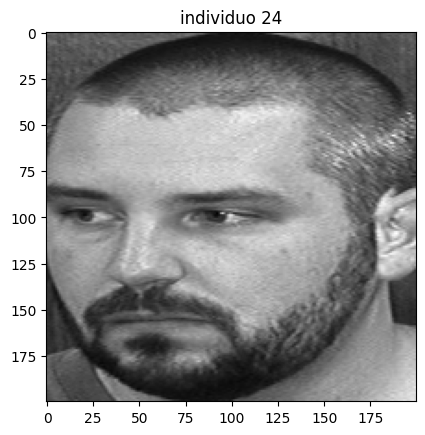

In [ ]:
plt.imshow(datos_train[0], cmap = 'gray')
plt.title("individuo " + str(individuos_train[0]))

Text(0.5, 1.0, 'individuo 20')

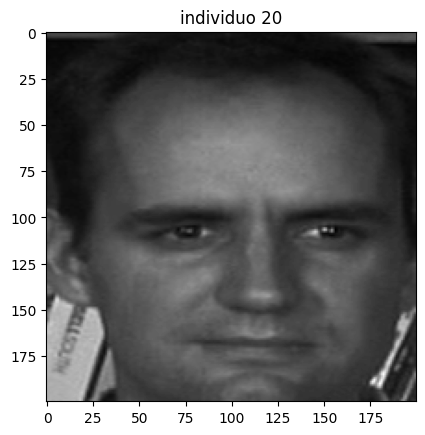

In [ ]:
plt.imshow(datos_test[0], cmap = 'gray')
plt.title("individuo " + str (individuos_test[0]))

#**Algoritmos de clasificacion**

In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score

In [ ]:
individuos_train = np.array(individuos_train, dtype = np.int32)
individuos_test = np.array(individuos_test, dtype = np.int32)

###EigenFaces

In [ ]:
modelo_eigenfaces = cv2.face.EigenFaceRecognizer_create()

In [ ]:
modelo_eigenfaces.train(datos_train, individuos_train)

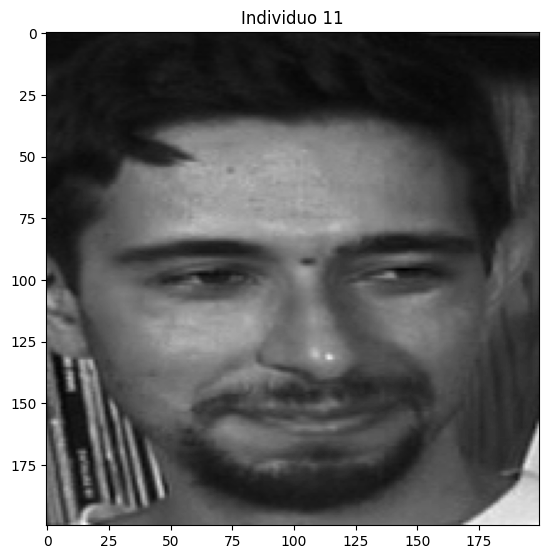

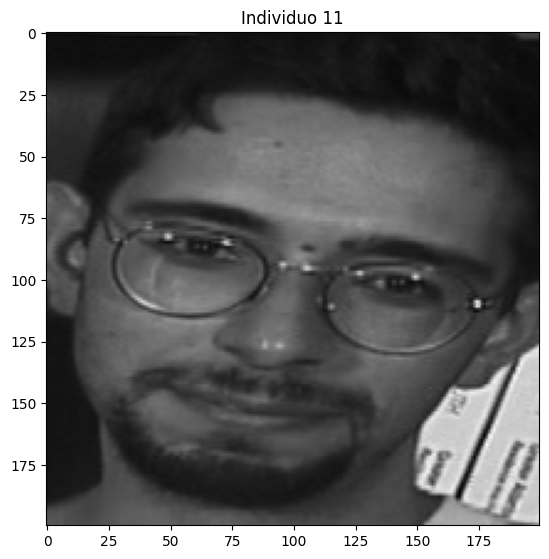

In [ ]:
plt.figure(figsize=(14, 7))

plt.subplot(121)
plt.title("Individuo " + str(individuos_test[2]))
plt.imshow(datos_test[2], cmap='gray')



plt.figure(figsize=(14, 7))

plt.subplot(122)
plt.title("Individuo " + str(individuos_test[15]))
plt.imshow(datos_test[15], cmap='gray')

In [ ]:
prediccion = modelo_eigenfaces.predict(datos_test[2])

In [ ]:
prediccion

(11, 4887.348993478355)

###FisherFaces

In [ ]:
modelo_fisherfaces = cv2.face.FisherFaceRecognizer_create()

In [ ]:
modelo_fisherfaces.train(datos_train, individuos_train)

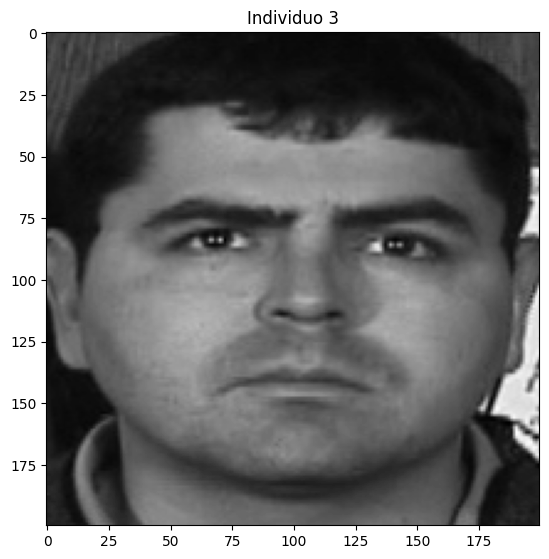

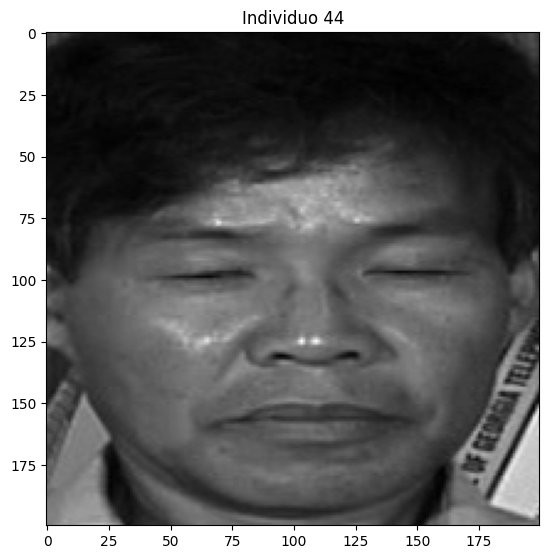

In [ ]:
plt.figure(figsize=(14, 7))

plt.subplot(121)
plt.title("Individuo " + str(individuos_test[13]))
plt.imshow(datos_test[13], cmap='gray')



plt.figure(figsize=(14, 7))

plt.subplot(122)
plt.title("Individuo " + str(individuos_test[23]))
plt.imshow(datos_test[23], cmap='gray')

plt.show()

In [ ]:
prediccion = modelo_fisherfaces.predict(datos_test[13])
prediccion

(3, 842.3930218400408)

In [ ]:
prediccion = modelo_fisherfaces.predict(datos_test[23])
prediccion

(16, 984.993722855433)

### Modelo LBPH

In [ ]:
modelo_lbph = cv2.face.LBPHFaceRecognizer_create()

In [ ]:
modelo_lbph.train(datos_train, individuos_train)

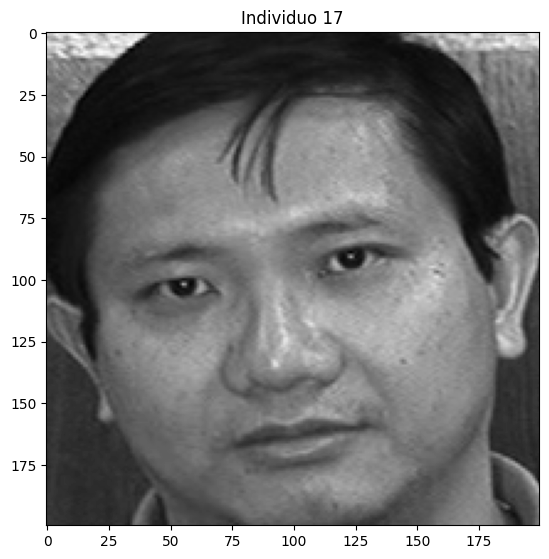

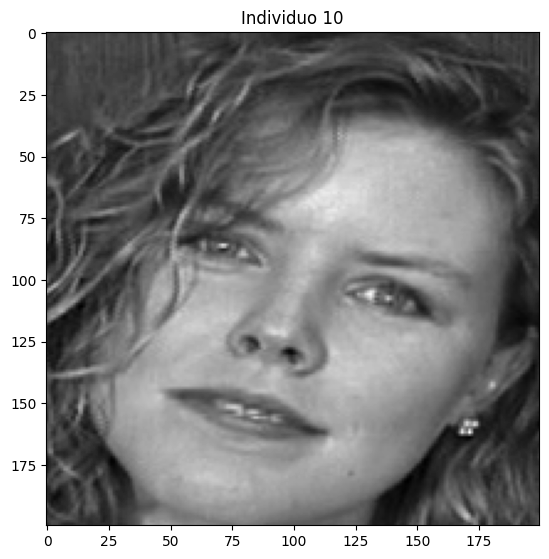

In [ ]:
plt.figure(figsize=(14, 7))

plt.subplot(121)
plt.title("Individuo " + str(individuos_test[27]))
plt.imshow(datos_test[27], cmap='gray')



plt.figure(figsize=(14, 7))

plt.subplot(122)
plt.title("Individuo " + str(individuos_test[37]))
plt.imshow(datos_test[37], cmap='gray')

plt.show()

In [ ]:
prediccion = modelo_lbph.predict(datos_test[27])
prediccion

(17, 39.587966022166185)

In [ ]:
prediccion = modelo_lbph.predict(datos_test[37])
prediccion

(10, 40.47462859245161)

In [ ]:
def exactitud(modelo):
  puntuacion = []
  for item in datos_test:
    puntuacion.append(modelo.predict(item)[0])
  resultado = accuracy_score(individuos_test, puntuacion)
  return resultado

In [ ]:
exactitud(modelo_eigenfaces)

0.724

In [ ]:
exactitud(modelo_fisherfaces)

0.52

In [ ]:
exactitud(modelo_lbph)

0.792

###Marcos Faciales

In [ ]:
import dlib
from scipy.spatial import distance as dist

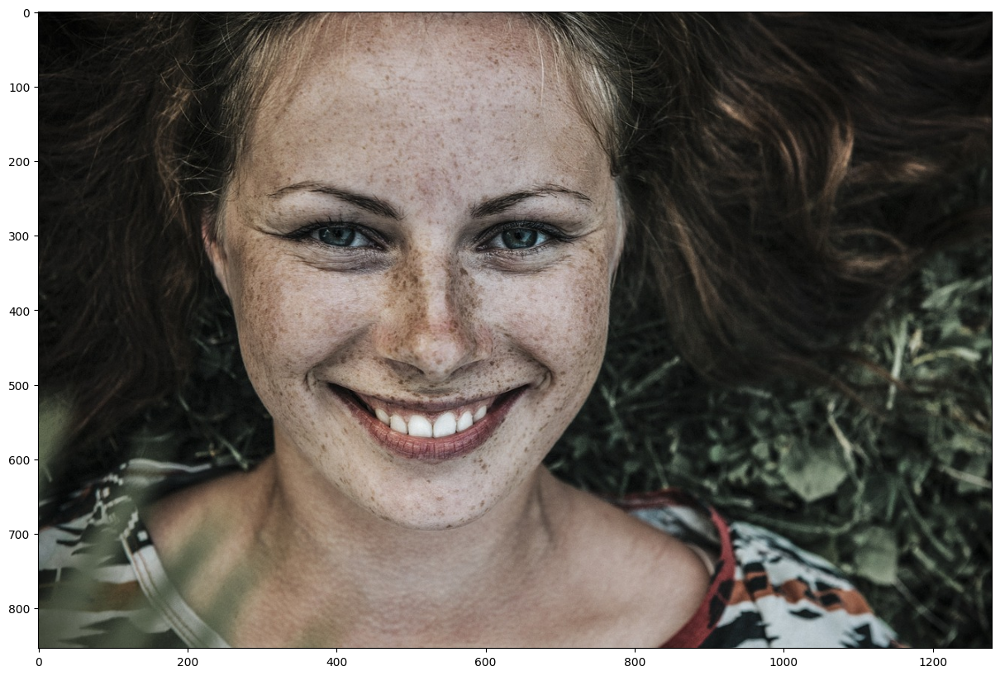

In [ ]:
imagen = cv2.imread("/content/drive/MyDrive/Analisis y clasificacion de rostros/Imagenes/px-woman-smilings.jpg")
imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,10))
plt.imshow(imagen)

In [ ]:
clasificador_dlib_68_path = "/content/drive/MyDrive/Analisis y clasificacion de rostros/Clasificadores/shape_predictor_68_face_landmarks.dat"
clasificador_dlib = dlib.shape_predictor(clasificador_dlib_68_path)
detector_facial = dlib.get_frontal_face_detector()


In [ ]:
#deteccion de rostro
def anotar_rostro(imagen):
  rectangulos = detector_facial(imagen, 1)
  if len(rectangulos) == 0:
    return None
  for k, d in enumerate(rectangulos):
    print("Identificado rostro " + str(k))
    cv2.rectangle(imagen, (d.left(), d.top()), (d.right(), d.bottom()), (255,255,0), 2)
  return imagen

Identificado rostro 0


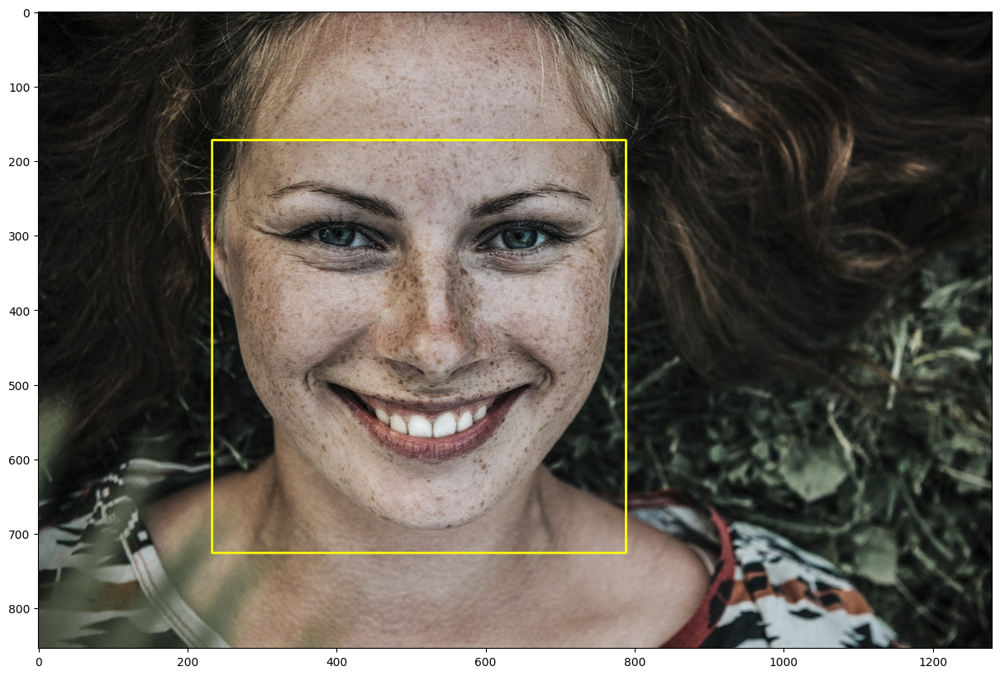

In [ ]:
imagen_anotada = imagen.copy()
imagen_anotada = anotar_rostro(imagen_anotada)
plt.figure(figsize = (20,10))
plt.imshow(imagen_anotada)

In [ ]:
def puntos_marcos_faciales(imagen):
  rectangulos = detector_facial(imagen, 1)
  if len(rectangulos) == 0:
    return None
  marcos = []

  for rec in rectangulos:
    marcos.append(np.matrix([[p.x, p.y] for p in clasificador_dlib(imagen, rec).parts()]))
    return marcos

In [ ]:
marcos_faciales = puntos_marcos_faciales(imagen)

In [ ]:
len (marcos_faciales[0])

68

In [ ]:
def anotar_marcos_faciales(imagen, marcos):
  for marco in marcos:
    for idx, punto in enumerate(marco):
      centro = (punto[0,0], punto[0,1])
      cv2.circle(imagen, centro, 3, (255,255,0), -1)
      cv2.putText(imagen, str(idx), centro, cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0,0,255), 1)
  return imagen

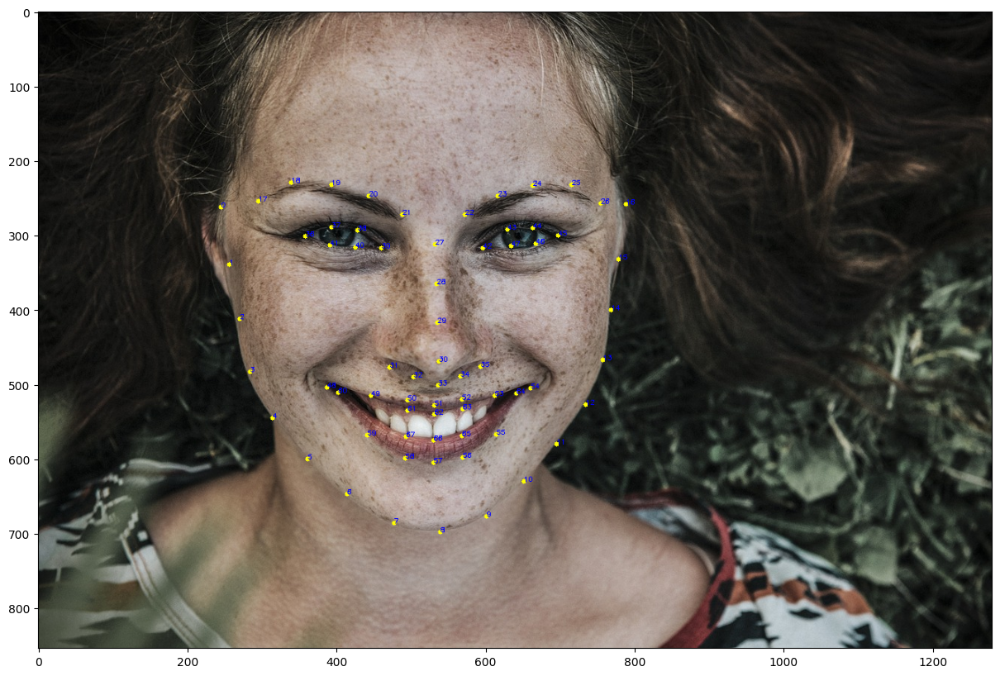

In [ ]:
imagen_anotada = imagen.copy()
imagen_anotada = anotar_marcos_faciales(imagen_anotada, marcos_faciales)
plt.figure(figsize=(22,10))
plt.imshow(imagen_anotada)

In [ ]:
ROSTRO = list(range(17, 68))
ROSTRO_COMPLETO = list(range(0, 68))
LABIOS = list(range(48, 60))
BOCA = list(range(60,68))
CEJA_DER = list(range(17, 22))
CEJA_IZQ = list(range(22, 27))
OJO_DER = list(range(36,42))
OJO_IZQ = list(range(42,48))
NARIZ = list(range(27,36))
MANDIBULA = list(range(0,17))

In [ ]:
def aspecto_razon_ojos(puntos_ojos):
  a = dist.euclidean(puntos_ojos[1], puntos_ojos[5])
  b = dist.euclidean(puntos_ojos[2], puntos_ojos[4])
  c = dist.euclidean(puntos_ojos[0], puntos_ojos[3])

  aspecto_razon = (a+b)/(2*c)

  return aspecto_razon

In [ ]:
def anotar_marcos_casco_convexo(imagen, marcos):
  rectangulos = detector_facial(imagen, 1)
  if len(rectangulos) == 0:
    return None

  for idx, rec in enumerate(rectangulos):
    marco = marcos[idx]
    puntos = cv2.convexHull(marcos[OJO_IZQ])
    cv2.drawContours(imagen, [puntos], 0, [0,255,0], 2)

    puntos = cv2.convexHull(marcos[OJO_DER])
    cv2.drawContours(imagen, [puntos], 0, [0,255,0], 2)

  return imagen

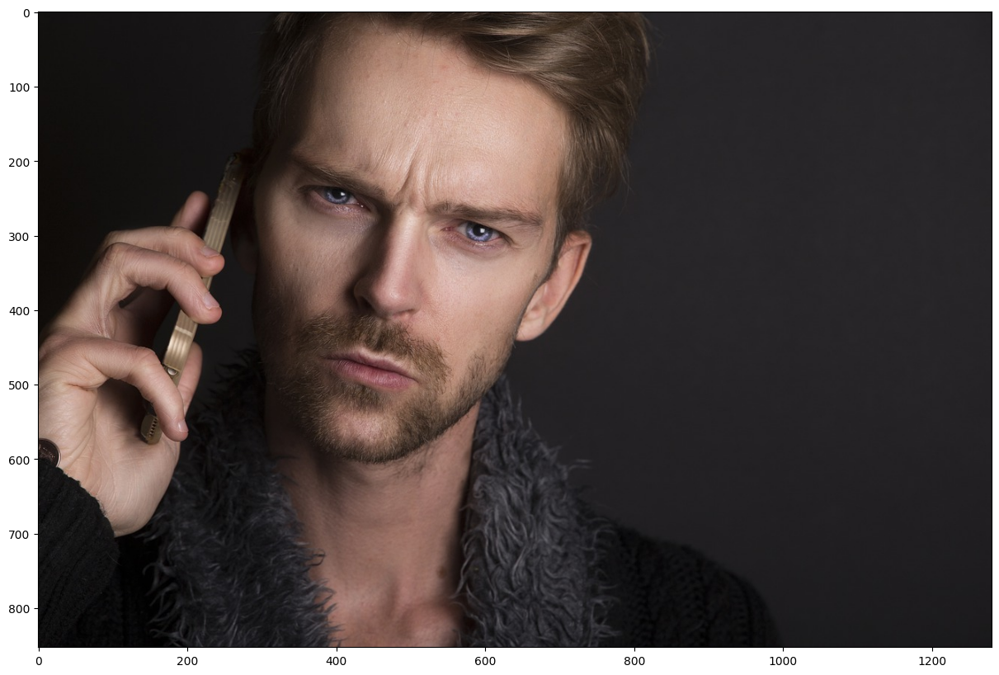

In [ ]:
imagen = cv2.imread("/content/drive/MyDrive/Analisis y clasificacion de rostros/Imagenes/px-man-serious.jpg")
imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,10))
plt.imshow(imagen)

In [ ]:
marcos_faciales = puntos_marcos_faciales(imagen)

In [ ]:
imagen_anotada = imagen.copy()
imagen_anotada = anotar_marcos_casco_convexo(imagen_anotada, marcos_faciales)
plt.figure(figsize=(22, 10))
plt.imshow(imagen_anotada)

TypeError: ignored

In [ ]:
def aspecto_razon_boca(puntos_boca):
  a = dist.euclidean(puntos_boca[1], puntos_boca[7])
  b = dist.euclidean(puntos_boca[2], puntos_boca[6])
  c = dist.euclidean(puntos_boca[3], puntos_boca[5])
  d = dist.euclidean(puntos_boca[0], puntos_boca[4])

  aspecto_razon = (a+b+c)/(3*d)

  return aspecto_razon

In [ ]:
def anotar_marcos_casco_convexo_boca(imagen, marcos):
  rectangulos = detector_facial(imagen, 1)
  if len(rectangulos) == 0:
    return None

  for idx, rec in enumerate(rectangulos):
    marco = marcos[idx]
    puntos = cv2.convexHull(marcos[BOCA])
    cv2.drawContours(imagen, [puntos], 0, [0,255,0], 2)

  return imagen

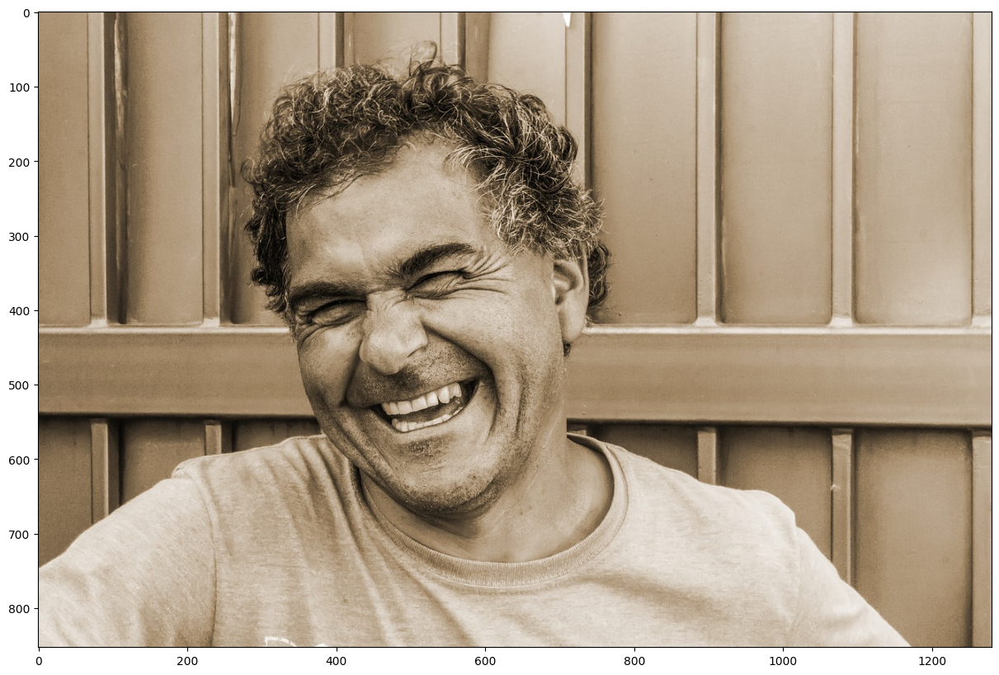

In [ ]:
imagen = cv2.imread("/content/drive/MyDrive/Analisis y clasificacion de rostros/Imagenes/px-man-happy.jpg")
imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,10))
plt.imshow(imagen)

In [ ]:
marcos_faciales = puntos_marcos_faciales(imagen)

In [ ]:
imagen_anotada = imagen.copy()
imagen_anotada = anotar_marcos_casco_convexo_boca(imagen_anotada, marcos_faciales)
plt.figure(figsize=(20,10))
plt.imshow(imagen_anotada)

TypeError: ignored

#Aplicaciones del analisis facial

In [ ]:
from io import BytesIO
from IPython.display import clear_output, Image, display
from PIL import Image as Img

In [ ]:
def estandarizar_imagen(frame):
  frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
  frame = cv2.resize(frame, (480,270))
  return frame

In [ ]:
def exhibir_video (frame):
  img = Img.fromarray(frame, "RGB")
  buffer = BytesIO()
  img.save(buffer, format="JPEG")
  display(Image(data=buffer.getvalue()))
  clear_output(wait=True)

In [ ]:
video = cv2.VideoCapture("/content/drive/MyDrive/Analisis y clasificacion de rostros/videos/expresiones.mov")

try:
  while(True):
    captura_ok, frame = video.read()
    if captura_ok:
      frame = estandarizar_imagen(frame)
      exhibir_video(frame)

except KeyboardInterrupt:
  video.release()
  print("Interrumpido")

Interrumpido


In [ ]:
video = cv2.VideoCapture("/content/drive/MyDrive/Analisis y clasificacion de rostros/videos/bostezo.mov")

ar_max = 0

try:
  while(True):
    captura_ok, frame = video.read()
    if captura_ok:
      frame = estandarizar_imagen(frame)
      marcos_faciales = puntos_marcos_faciales(frame)

      if marcos_faciales is not None:
        ar_boca = aspecto_razon_boca(marcos_faciales[0][BOCA])
        ar_boca = round(ar_boca,3)
        if ar_boca > ar_max:
          ar_max = ar_boca

        info = "Boca " + str (ar_boca) + "Maximo " + str(ar_max)

        frame = anotar_marcos_casco_convexo_boca(frame, marcos_faciales)

        cv2.putText(frame, info, (20,50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)


      exhibir_video(frame)

except KeyboardInterrupt:
  video.release()
  print("Interrumpido")

ValueError: ignored

In [ ]:
video = cv2.VideoCapture("/content/drive/MyDrive/Analisis y clasificacion de rostros/videos/ojos_cerrados.mov")

min_ojo_izq = 1
min_ojo_der = 1
max_ojo_izq = 0
max_ojo_der = 0

try:
  while(True):
    captura_ok, frame = video.read()
    if captura_ok:
      frame = estandarizar_imagen(frame)
      marcos_faciales = puntos_marcos_faciales(frame)

      if marcos_faciales is not None:
        ar_ojo_izq = aspecto_razon_ojos(marcos_faciales[0][OJO_IZQ])
        ar_ojo_der = aspecto_razon_ojos(marcos_faciales[0][OJO_DER])
        ar_ojo_izq = round(ar_ojo_izq, 3)
        ar_ojo_der = round(ar_ojo_der, 3)

        if ar_ojo_izq < min_ojo_izq:
          min_ojo_izq = ar_ojo_izq
        if ar_ojo_izq > max_ojo_izq:
          max_ojo_izq = ar_ojo_izq

        if ar_ojo_der < min_ojo_der:
          min_ojo_der = ar_ojo_der
        if ar_ojo_der > max_ojo_der:
          max_ojo_der = ar_ojo_der

        info_ojo_izq = "Ojo izquierdo " + str(ar_ojo_izq) + " Maximo " + str(max_ojo_izq) + "Minimo " + str(min_ojo_izq)
        info_ojo_der = "Ojo derecho " + str(ar_ojo_der) + " Maximo " + str(max_ojo_der) + "Minimo " + str(min_ojo_der)

        frame = anotar_marcos_casco_convexo(frame, marcos_faciales)

        cv2.putText(frame, info_ojo_izq, (20,50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
        cv2.putText(frame, info_ojo_der, (20,80), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)


      exhibir_video(frame)

except KeyboardInterrupt:
  video.release()
  print("Interrumpido")

ValueError: ignored